##**1) Baixando as imagens de teste**

Desta forma as imagens ficarão disponíveis somente enquanto esta sessão permanecer ativa ou até que o usuário  clique em >Runtime>Factory reset runtime

In [ ]:
!git clone https://github.com/guimota-uerj/TestImages.git

Cloning into 'TestImages'...
remote: Enumerating objects: 104, done.
remote: Total 104 (delta 0), reused 0 (delta 0), pack-reused 104
Receiving objects: 100% (104/104), 19.32 MiB | 30.20 MiB/s, done.
Resolving deltas: 100% (21/21), done.


In [ ]:
%cd /content/TestImages/Landsat/
%ls

/content/TestImages/Landsat
FusaoLandsat8.png                               LANDSAT_7_ETMXS_20000111_217_076_L2_BAND2.tif
LANDSAT_7_ETMPAN_20000111_217_076_L2_BAND8.tif  LANDSAT_7_ETMXS_20000111_217_076_L2_BAND3.tif
LANDSAT_7_ETMXS_20000111_217_076_L2_BAND1.tif   TestImages/


#**Trabalho 8: Pan-Sharpening**
Implemente o esquema de fusãão PAN (Pan-Sharpening) apresentado na figura a seguir. Inspire-se nos trechos de código apresentados ao longo destes exemplos para fazê-lo.



(765, 1628, 3)


(-0.5, 1627.5, 764.5, -0.5)

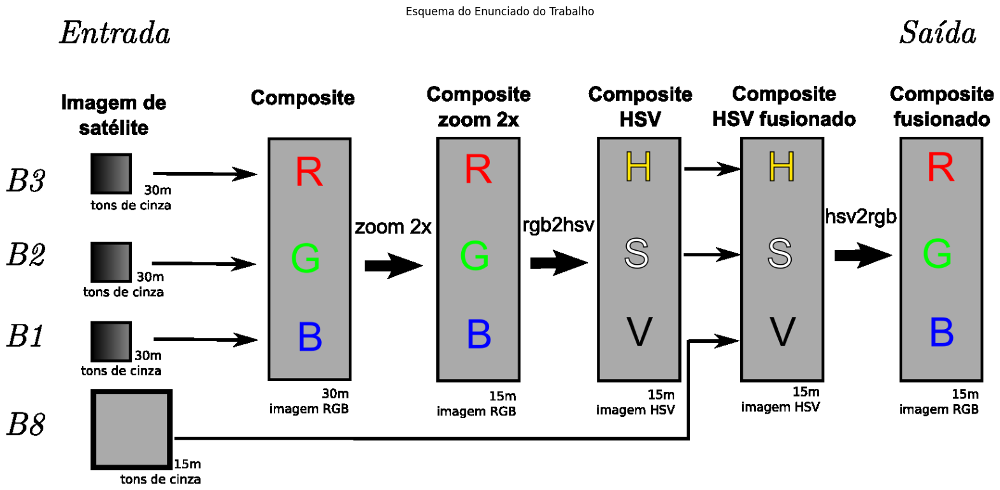

In [ ]:
import cv2
import matplotlib.pyplot as plt
#from google.colab.patches import cv2_imshow
img = cv2.imread('FusaoLandsat8.png', 1)
print(img.shape)
plt.figure(figsize = (20,15)) # figsize : (float width, float height)  in inches.
plt.title('Esquema do Enunciado do Trabalho')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
#plt.show()

## **Este código apresenta como obter as bandas 1, 2, 3 e 8 da imagem de teste diretamente do github**

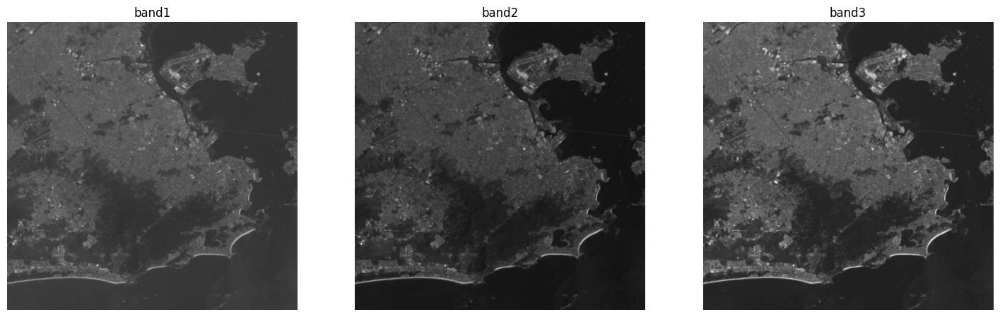

In [ ]:
import cv2
import matplotlib.pyplot as plt
#from google.colab.patches import cv2_imshow
img = cv2.imread('LANDSAT_7_ETMPAN_20000111_217_076_L2_BAND8.tif', 0)

band1 = cv2.imread('LANDSAT_7_ETMXS_20000111_217_076_L2_BAND1.tif', 0)
band2 = cv2.imread('LANDSAT_7_ETMXS_20000111_217_076_L2_BAND2.tif', 0)
band3 = cv2.imread('LANDSAT_7_ETMXS_20000111_217_076_L2_BAND3.tif', 0)

plt.figure(figsize = (18,18)) # figsize : (float width, float height)  in inches.

plt.subplot(3,3,1)
plt.title('band1')
plt.imshow(band1, cmap = 'gray', interpolation = 'bicubic',aspect='auto')
plt.axis('off')


plt.subplot(3,3,2)
plt.title('band2')
plt.imshow(band2, cmap = 'gray', interpolation = 'bicubic',aspect='auto')
plt.axis('off')


plt.subplot(3,3,3)
plt.title('band3')
plt.imshow(band3, cmap = 'gray', interpolation = 'bicubic',aspect='auto')
plt.axis('off')
plt.show()


##**2) O código a seguir demonstra como fazer a uma operaçãão geoméétrica. Modifique-o para fazer o zoom das bandas H e S**

In [ ]:
%cd /content/TestImages/StormTrooper/
import cv2
import matplotlib.pyplot as plt
import numpy as np

print(band1.shape == band2.shape == band3.shape)
i,j = img.shape[0],img.shape[1]  #img dimensions

M = np.float32([[2, 0,0], [0,2,0], [0,0,1]])
print("Matriz de transformação para zoom de 2x:\n",M,"\n")

#aplicação do zoom de 2x das imagens com dimensao de 1024x1024 para as dimensoes de 2028x20248 da banda 8
band1_z2x = cv2.warpPerspective(band1,M,(i,j),flags=cv2.INTER_NEAREST)
band2_z2x = cv2.warpPerspective(band2,M,(i,j),flags=cv2.INTER_NEAREST)
band3_z2x = cv2.warpPerspective(band3,M,(i,j),flags=cv2.INTER_NEAREST)

plt.figure(figsize = (15,15), dpi= 250)
plt.subplot (331), plt.axis('on'), plt.imshow(band1, cmap = 'gray', interpolation = 'bicubic'),plt.title('band1')
plt.subplot (334), plt.axis('on'), plt.imshow(band1_z2x, cmap = 'gray', interpolation = 'bicubic'),plt.title('band1_2x')

plt.subplot (332), plt.axis('off'), plt.imshow(band2, cmap = 'gray', interpolation = 'bicubic'),plt.title('band2')
plt.subplot (335), plt.axis('off'), plt.imshow(band2_z2x, cmap = 'gray', interpolation = 'bicubic'),plt.title('band2_2x')

plt.subplot (333), plt.axis('off'), plt.imshow(band3, cmap = 'gray', interpolation = 'bicubic'),plt.title('band3')
plt.subplot (336), plt.axis('off'), plt.imshow(band3_z2x, cmap = 'gray', interpolation = 'bicubic'),plt.title('band3_2x')

plt.show()

/content/TestImages/StormTrooper
True
Matriz de transformação para zoom de 2x:
 [[2. 0. 0.]
 [0. 2. 0.]
 [0. 0. 1.]] 



##**3) Fusão de imagens tons de cinza em uma imagem colorida**

(<Axes: title={'center': 'Composite Fusionado'}>,
 (0.0, 1.0, 0.0, 1.0),
 Text(0.5, 1.0, 'Composite Fusionado'))

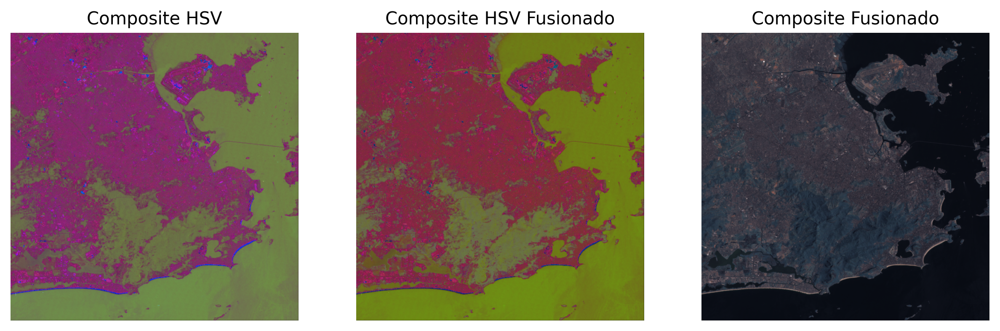

In [ ]:
#junção das bandas 1,2,3
#conversao do Composite 2x para formato HSV
composite_2x_hsv = cv2.cvtColor(np.stack((band1_z2x,band2_z2x, band3_z2x), axis=2), cv2.COLOR_BGR2HSV)

#separação pois nos interessam apenas os canais h e s
h, s, v = cv2.split(composite_2x_hsv)

#substituição do canal v pelo canal da banda8 usando a função merge para recompor a imagem
rgb_composite_fusion = cv2.merge([h,s,img])

plt.figure(figsize = (12,12), dpi = 250)
plt.subplot (131), plt.axis('off'), plt.imshow(composite_2x_hsv, interpolation = 'bicubic'),plt.title('Composite HSV')
plt.subplot (132), plt.axis('off'), plt.imshow(rgb_composite_fusion, interpolation = 'bicubic'),plt.title('Composite HSV Fusionado')
plt.subplot (133), plt.axis('off'), plt.imshow(cv2.cvtColor(rgb_composite_fusion, cv2.COLOR_HSV2RGB), interpolation = 'bicubic'),plt.title('Composite Fusionado')

# Resultado Final

/content/TestImages/Landsat


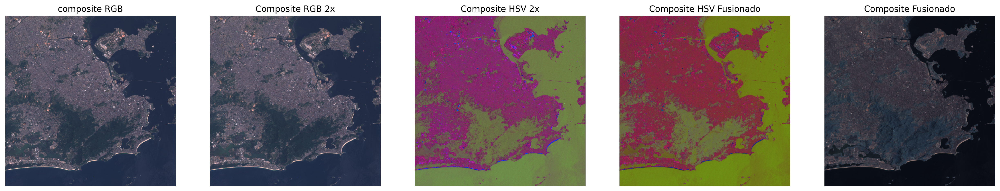

In [ ]:
%cd /content/TestImages/Landsat/
band1 = cv2.imread('LANDSAT_7_ETMXS_20000111_217_076_L2_BAND1.tif', 0)
band2 = cv2.imread('LANDSAT_7_ETMXS_20000111_217_076_L2_BAND2.tif', 0)
band3 = cv2.imread('LANDSAT_7_ETMXS_20000111_217_076_L2_BAND3.tif', 0)

plt.figure(figsize = (25,25), dpi = 250) # figsize : (float width, float height)  in inches.
plt.subplot(1,5,1)
plt.title('composite RGB')
plt.axis('off')
plt.imshow(cv2.cvtColor(np.stack((band1,band2, band3), axis=2), cv2.COLOR_BGR2RGB))

plt.subplot(1,5,2)
plt.title('Composite RGB 2x')
plt.axis('off')
plt.imshow(cv2.cvtColor(np.stack((band1_z2x,band2_z2x, band3_z2x), axis=2), cv2.COLOR_BGR2RGB))

plt.subplot(1,5,3)
plt.title('Composite HSV 2x')
plt.axis('off')
plt.imshow(composite_2x_hsv)

plt.subplot(1,5,4)
plt.title('Composite HSV Fusionado')
plt.axis('off')
plt.imshow(rgb_composite_fusion, interpolation = 'bicubic')

plt.subplot(1,5,5)
plt.title('Composite Fusionado')
plt.axis('off')
plt.imshow(cv2.cvtColor(rgb_composite_fusion, cv2.COLOR_HSV2RGB), interpolation = 'bicubic')

plt.show()


#Observações

## O processo foi realizado conforme a imagem orienta, isto é:
* Cada uma das bandas rgb sofreu uma transformação geométrica que lhes aplicou um zoom de 2x, além disso, as dimensões foram alteradas de 1024x1024 para 2048x2048 - isso foi necessário pois a banda8 está nessas dimensões.
* Em seguidas as bandas foram agrupadas em uma imagem rgb intermediária para que a conversão do sistema de cor rgb para o sistema hsv fosse feita.
* Após essa conversão, o canal v foi substituído pelo canal da banda 8 e os canais h e s foram mantidos. A imagem foi reconstruída, formando o Composite Fusionado.
* Por fim, a imagem hsv foi convertida para o sistema rgb.

##Comentários:
1. Os resultados são perceptíveis ao olhar-se para a região do Parque Nacional da Tijuca, a grande região verde da imagem, o qual, após o PAN-Sharpening, apresenta maior definição de relevo, sendo possível perceber as curvas da elevações.
2. Além disso, as lagoas de jacarepaguá tornaram-se mais diferenciáveis das regiões de mata próximas, apresentando não mais um azul escuro com tons esverdeados, mas um azul profundo, permitindo a percepção de que é um corpo d'água.
3. As tonalidades brancas das áreas urbanas deixaram de estar presentes, dando lugar a uma tonalidade mais próxima da tonalidade de asfalto/cimento.
4. De modo geral, os corpos d'água ficaram mais definidos, as áreas de elevações mais perceptíveis e as zonas urbanas mais homogêneas nas tonalidades de cinza mas com uma baixa exposição.